In [389]:
import geopandas as gpd
from shapely.geometry import Point, Polygon, MultiPoint
from ast import literal_eval
import pandas as pd
import matplotlib.pyplot as plt
import folium
from folium.plugins import MarkerCluster, BeautifyIcon
import seaborn as sns

In [115]:
seniors = pd.read_csv('all_seniors.csv')

In [305]:
def point(coords):
    try:
        row = literal_eval(coords)
    except Exception as e:
        print(f'error: {e}')
        return None
    newlst = []
    try:
        for tupl in row: 
            if len(tupl) == 2:
                newlst.append(Point(tupl[1], tupl[0]))
        polygon = MultiPoint([[p.x, p.y] for p in newlst])
        return polygon
    except Exception as e:
        print(f'error: {e}')
        return None
    

In [306]:
seniors['bounds'] = seniors['coords'].apply(point)

error: malformed node or string: nan
error: malformed node or string: nan
error: malformed node or string: nan
error: malformed node or string: nan
error: malformed node or string: nan
error: malformed node or string: nan
error: malformed node or string: nan


In [307]:
seniors['boundaries'] = seniors['bounds'].apply(lambda x: None if x == None else x.convex_hull )

In [308]:
seniors

,Unnamed: 0,Unnamed: 0.1,linkid,Region_of_Origin,District_of_Origin,County_of_Origin,Average_Daily_SeniorPopulation_Travelling,coords,bounds,boundaries
0,0,81588,902118888,R1 - AM Lisboa,Lisboa,Odivelas,12060.92703,"[(38.84041, -9.2019), (38.84039, -9.20235), (3...","(POINT (-9.2019 38.84041), POINT (-9.202349999...","POLYGON ((-9.22847 38.80249, -9.22915000000000..."
1,1,107603,1179323932,R1 - AM Lisboa,Setúbal,Barreiro,12041.84744,"[(38.66177, -9.05469), (38.66177, -9.05469), (...","(POINT (-9.054690000000001 38.66177), POINT (-...","POLYGON ((-9.08592 38.62791, -9.09725000000000..."
2,2,116961,1217938718,R2 - AM Porto,Porto,Maia,12041.24656,"[(41.22752, -8.69786), (41.22566, -8.68455), (...","(POINT (-8.69786 41.22752), POINT (-8.68455 41...","POLYGON ((-8.69483 41.22005, -8.70149 41.2226,..."
3,3,81496,902115622,R1 - AM Lisboa,Lisboa,Odivelas,12029.15309,"[(38.84041, -9.2019), (38.84039, -9.20235), (3...","(POINT (-9.2019 38.84041), POINT (-9.202349999...","POLYGON ((-9.22847 38.80249, -9.22915000000000..."
4,4,18823,542417300,R1 - AM Lisboa,Setúbal,Barreiro,12011.94845,"[(38.654, -9.0765), (38.65559, -9.07938), (38....","(POINT (-9.076499999999999 38.654), POINT (-9....","POLYGON ((-9.076639999999999 38.65162, -9.0797..."
...,...,...,...,...,...,...,...,...,...,...
995,95,45976,587665812,R1 - AM Lisboa,Lisboa,Vila Franca de Xira,12088.57334,"[(38.96114, -9.02975), (38.97688, -9.04026), (...","(POINT (-9.02975 38.96114), POINT (-9.04026 38...","POLYGON ((-9.022650000000001 38.9347, -9.05194..."
996,96,61725,812033959,R1 - AM Lisboa,Lisboa,Lisboa,12077.80566,"[(38.74479, -9.18437), (38.74512, -9.18407), (...","(POINT (-9.184369999999999 38.74479), POINT (-...","POLYGON ((-9.14372 38.71497, -9.17331000000000..."
997,97,102349,1120886073,R1 - AM Lisboa,Lisboa,Vila Franca de Xira,12075.63971,"[(38.84811, -9.08775), (38.87157, -9.06895), (...","(POINT (-9.08775 38.84811), POINT (-9.06894999...","POLYGON ((-9.09491 38.84677, -9.09698 38.86513..."
998,98,25803,543128030,R2 - AM Porto,Porto,Maia,12074.47907,"[(41.22495, -8.63957), (41.22598, -8.63999), (...","(POINT (-8.639570000000001 41.22495), POINT (-...","POLYGON ((-8.6502 41.21991, -8.651910000000001..."


In [309]:
seniors_new = seniors[['linkid', 'boundaries', 'Average_Daily_SeniorPopulation_Travelling']]

In [310]:
seniors_new.to_csv('new_seniors.csv')

In [311]:
stops = pd.read_csv('all_stops.csv')

In [312]:
stops

,stop_name,stop_id,stop_lat,stop_lon,carrier,identifier
0,25 de Abril,12_2,38.684230,-9.149850,data_metro_transportes_do_sul,2
1,A Bonecos (Avª 1º Maio 105),11_1125,38.611905,-9.090433,data_tst,1125
2,A Bonecos (Avª 1º Maio 126),11_1000,38.611941,-9.090387,data_tst,1000
3,A Bonecos (Avª 1º Maio 31),11_1001,38.617150,-9.084568,data_tst,1001
4,A Bonecos (Avª 1º Maio 53),11_1002,38.614783,-9.086502,data_tst,1002
...,...,...,...,...,...,...
4463,Águas Moura (Avª Liberdade 86) Fte Correios,11_446,38.583959,-8.690961,data_tst,446
4464,Águas Moura (Avª Liberdade) Fte Lavadouro Muni...,11_450,38.584226,-8.697166,data_tst,450
4465,Águas Moura (Avª Liberdade) Lavadouro Municipal,11_449,38.584228,-8.697199,data_tst,449
4466,Águas Moura (EN 5) (X) (EM 1038),11_3224,38.588153,-8.692657,data_tst,3224


In [313]:
seniors_new['inside_stops'] = None

<ipython-input-313-2bb95194b926>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  seniors_new['inside_stops'] = None


In [314]:
seniors_new

,linkid,boundaries,Average_Daily_SeniorPopulation_Travelling,inside_stops
0,902118888,"POLYGON ((-9.22847 38.80249, -9.22915000000000...",12060.92703,None
1,1179323932,"POLYGON ((-9.08592 38.62791, -9.09725000000000...",12041.84744,None
2,1217938718,"POLYGON ((-8.69483 41.22005, -8.70149 41.2226,...",12041.24656,None
3,902115622,"POLYGON ((-9.22847 38.80249, -9.22915000000000...",12029.15309,None
4,542417300,"POLYGON ((-9.076639999999999 38.65162, -9.0797...",12011.94845,None
...,...,...,...,...
995,587665812,"POLYGON ((-9.022650000000001 38.9347, -9.05194...",12088.57334,None
996,812033959,"POLYGON ((-9.14372 38.71497, -9.17331000000000...",12077.80566,None
997,1120886073,"POLYGON ((-9.09491 38.84677, -9.09698 38.86513...",12075.63971,None
998,543128030,"POLYGON ((-8.6502 41.21991, -8.651910000000001...",12074.47907,None


In [315]:
def points(row):
    point = Point(float(row["stop_lat"]), float(row["stop_lon"]))
    return point

In [316]:
stops['point'] = stops.apply(points, axis=1)


In [343]:
def lies_in(polys, stops):
    polys['inside_stops'] = None
    for c, p in polys.iterrows():
        print(p)
        print(c)
        lst = []
#         line = LineString(p['boundaries'])
#         polygon = Polygon(line)
        polygon = p['boundaries']
        for co, s in stops.iterrows():
            point = s['point']
            try:
                if polygon.contains(point):
                    print(f'found point {point}')
                    lst.append(point)
            except:
                break
        lens = len(lst)
#         lst = [[x] for x in lst]
#         print(lst)
        polys.loc[c, 'inside_stops'] = lens
    return polys
                
        

In [344]:
seniors_lies_new = lies_in(seniors_new, stops)

<ipython-input-343-e0b8b619fee7>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  polys['inside_stops'] = None


linkid                                                                               902118888
boundaries                                   POLYGON ((-9.22847 38.80249, -9.22915000000000...
Average_Daily_SeniorPopulation_Travelling                                          12060.92703
inside_stops                                                                              None
Name: 0, dtype: object
0


/home/moritzgeiger/.pyenv/versions/3.8.6/envs/lewagon/lib/python3.8/site-packages/pandas/core/indexing.py:1719: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


linkid                                                                              1179323932
boundaries                                   POLYGON ((-9.08592 38.62791, -9.09725000000000...
Average_Daily_SeniorPopulation_Travelling                                          12041.84744
inside_stops                                                                              None
Name: 1, dtype: object
1
linkid                                                                              1217938718
boundaries                                   POLYGON ((-8.69483 41.22005, -8.70149 41.2226,...
Average_Daily_SeniorPopulation_Travelling                                          12041.24656
inside_stops                                                                              None
Name: 2, dtype: object
2
linkid                                                                               902115622
boundaries                                   POLYGON ((-9.22847 38.80249, -9.22915000000000...


linkid                                                                               902118886
boundaries                                   POLYGON ((-9.22847 38.80249, -9.22915000000000...
Average_Daily_SeniorPopulation_Travelling                                          11897.20078
inside_stops                                                                              None
Name: 22, dtype: object
22
linkid                                                                               877593287
boundaries                                   POLYGON ((-9.224690000000001 38.80223, -9.2253...
Average_Daily_SeniorPopulation_Travelling                                          11882.40933
inside_stops                                                                              None
Name: 23, dtype: object
23
linkid                                                                              1046801565
boundaries                                   POLYGON ((-9.151540000000001 38.7373, -9.16131

linkid                                                                               895694358
boundaries                                   POLYGON ((-8.57033 41.17946, -8.58801000000000...
Average_Daily_SeniorPopulation_Travelling                                          11686.76644
inside_stops                                                                              None
Name: 43, dtype: object
43
linkid                                                                               717714189
boundaries                                   POLYGON ((-8.66131 41.24185, -8.66743 41.24193...
Average_Daily_SeniorPopulation_Travelling                                          11686.76644
inside_stops                                                                              None
Name: 44, dtype: object
44
linkid                                                                               916010251
boundaries                                   POLYGON ((-8.946429999999999 38.67738, -8.9653

linkid                                                                               553204845
boundaries                                   POLYGON ((-9.22451 38.71549, -9.22852999999999...
Average_Daily_SeniorPopulation_Travelling                                          11556.85025
inside_stops                                                                              None
Name: 64, dtype: object
64
linkid                                         543101435
boundaries                                          None
Average_Daily_SeniorPopulation_Travelling    11551.92489
inside_stops                                        None
Name: 65, dtype: object
65
linkid                                                                               916189660
boundaries                                   POLYGON ((-9.08592 38.62791, -9.09725000000000...
Average_Daily_SeniorPopulation_Travelling                                          11548.85714
inside_stops                                         

linkid                                                                               915160351
boundaries                                   POLYGON ((-8.89799 38.53979, -8.92151 38.56789...
Average_Daily_SeniorPopulation_Travelling                                          11426.95067
inside_stops                                                                              None
Name: 85, dtype: object
85
linkid                                                                               587590958
boundaries                                   POLYGON ((-9.022650000000001 38.9347, -9.05194...
Average_Daily_SeniorPopulation_Travelling                                          11423.73539
inside_stops                                                                              None
Name: 86, dtype: object
86
linkid                                                                              1170739147
boundaries                                   POLYGON ((-8.596259999999999 41.13138, -8.6062

linkid                                                                              1001831008
boundaries                                   POLYGON ((-8.606909999999999 41.13234, -8.6081...
Average_Daily_SeniorPopulation_Travelling                                          13902.26719
inside_stops                                                                              None
Name: 106, dtype: object
106
linkid                                                                               537272813
boundaries                                   POLYGON ((-9.151540000000001 38.7373, -9.16131...
Average_Daily_SeniorPopulation_Travelling                                          13879.68105
inside_stops                                                                              None
Name: 107, dtype: object
107
linkid                                                                               811754003
boundaries                                   POLYGON ((-8.616949999999999 41.13163, -8.

linkid                                                                               576721583
boundaries                                   POLYGON ((-8.65432 41.24152, -8.65645 41.24224...
Average_Daily_SeniorPopulation_Travelling                                           13647.4846
inside_stops                                                                              None
Name: 127, dtype: object
127
linkid                                                                               543100321
boundaries                                   POLYGON ((-8.60778 41.154, -8.61331 41.1546, -...
Average_Daily_SeniorPopulation_Travelling                                           13625.3296
inside_stops                                                                              None
Name: 128, dtype: object
128
linkid                                                                               543104137
boundaries                                   POLYGON ((-8.596259999999999 41.13138, -8.

linkid                                                                               874933952
boundaries                                   POLYGON ((-8.95049 38.58317, -8.96728000000000...
Average_Daily_SeniorPopulation_Travelling                                          13372.95967
inside_stops                                                                              None
Name: 148, dtype: object
148
linkid                                                                              1217938636
boundaries                                   POLYGON ((-8.69483 41.22005, -8.70149 41.2226,...
Average_Daily_SeniorPopulation_Travelling                                          13370.54701
inside_stops                                                                              None
Name: 149, dtype: object
149
linkid                                                                               907429588
boundaries                                   POLYGON ((-8.460509999999999 41.04479, -8.

linkid                                                                               772810785
boundaries                                   POLYGON ((-9.251250000000001 38.73551, -9.2707...
Average_Daily_SeniorPopulation_Travelling                                          13228.24092
inside_stops                                                                              None
Name: 169, dtype: object
169
linkid                                                                               835593684
boundaries                                   POLYGON ((-8.596259999999999 41.13138, -8.6062...
Average_Daily_SeniorPopulation_Travelling                                          13207.48431
inside_stops                                                                              None
Name: 170, dtype: object
170
linkid                                                                              1219264306
boundaries                                   POLYGON ((-8.60778 41.154, -8.61331 41.154

linkid                                                                              1219257928
boundaries                                   POLYGON ((-8.606909999999999 41.13234, -8.6081...
Average_Daily_SeniorPopulation_Travelling                                          13016.06689
inside_stops                                                                              None
Name: 190, dtype: object
190
linkid                                                                               575144218
boundaries                                   POLYGON ((-8.620760000000001 41.17386, -8.6349...
Average_Daily_SeniorPopulation_Travelling                                          13016.06689
inside_stops                                                                              None
Name: 191, dtype: object
191
linkid                                                                               576721620
boundaries                                   POLYGON ((-8.6502 41.21991, -8.65191000000

linkid                                                                               820574812
boundaries                                   POLYGON ((-8.66131 41.24185, -8.66743 41.24193...
Average_Daily_SeniorPopulation_Travelling                                          18131.61031
inside_stops                                                                              None
Name: 211, dtype: object
211
linkid                                                                               907591784
boundaries                                   POLYGON ((-8.606909999999999 41.13234, -8.6081...
Average_Daily_SeniorPopulation_Travelling                                          18127.28939
inside_stops                                                                              None
Name: 212, dtype: object
212
linkid                                                                               916189647
boundaries                                   POLYGON ((-9.08592 38.62791, -9.0972500000

linkid                                                                               576721556
boundaries                                   POLYGON ((-8.6502 41.21991, -8.651910000000001...
Average_Daily_SeniorPopulation_Travelling                                          17902.30598
inside_stops                                                                              None
Name: 232, dtype: object
232
linkid                                                                               717714190
boundaries                                   POLYGON ((-8.66131 41.24185, -8.66743 41.24193...
Average_Daily_SeniorPopulation_Travelling                                          17865.75022
inside_stops                                                                              None
Name: 233, dtype: object
233
linkid                                                                               907591785
boundaries                                   POLYGON ((-8.606909999999999 41.13234, -8.

linkid                                                                              1172433799
boundaries                                   POLYGON ((-8.606909999999999 41.13234, -8.6081...
Average_Daily_SeniorPopulation_Travelling                                          17664.26839
inside_stops                                                                              None
Name: 253, dtype: object
253
linkid                                                                               576717109
boundaries                                   POLYGON ((-8.66131 41.24185, -8.66743 41.24193...
Average_Daily_SeniorPopulation_Travelling                                           17663.0319
inside_stops                                                                              None
Name: 254, dtype: object
254
linkid                                                                               537315333
boundaries                                   POLYGON ((-9.224690000000001 38.80223, -9.

linkid                                                                               542414005
boundaries                                   POLYGON ((-9.08592 38.62791, -9.09725000000000...
Average_Daily_SeniorPopulation_Travelling                                           17531.7834
inside_stops                                                                              None
Name: 274, dtype: object
274
linkid                                                                               576717068
boundaries                                   POLYGON ((-8.66131 41.24185, -8.66743 41.24193...
Average_Daily_SeniorPopulation_Travelling                                           17524.5631
inside_stops                                                                              None
Name: 275, dtype: object
275
linkid                                                                               915159802
boundaries                                   POLYGON ((-8.96513 38.55708, -8.95049 38.5

linkid                                                                               915267127
boundaries                                   POLYGON ((-8.96513 38.55708, -8.95049 38.58317...
Average_Daily_SeniorPopulation_Travelling                                          17403.44064
inside_stops                                                                              None
Name: 295, dtype: object
295
linkid                                                                              1190073738
boundaries                                   POLYGON ((-8.96513 38.55708, -8.95049 38.58317...
Average_Daily_SeniorPopulation_Travelling                                          17387.62628
inside_stops                                                                              None
Name: 296, dtype: object
296
linkid                                                                               575144749
boundaries                                   POLYGON ((-8.627829999999999 41.17585, -8.

linkid                                                                               892255408
boundaries                                   POLYGON ((-8.69483 41.22005, -8.70149 41.2226,...
Average_Daily_SeniorPopulation_Travelling                                          23993.82528
inside_stops                                                                              None
Name: 316, dtype: object
316
linkid                                                                               576732322
boundaries                                   POLYGON ((-8.956469999999999 38.5613, -8.961 3...
Average_Daily_SeniorPopulation_Travelling                                          23611.59383
inside_stops                                                                              None
Name: 317, dtype: object
317
linkid                                                                               892255399
boundaries                                   POLYGON ((-8.69483 41.22005, -8.70149 41.2

linkid                                                                               812328407
boundaries                                   POLYGON ((-8.956469999999999 38.5613, -8.961 3...
Average_Daily_SeniorPopulation_Travelling                                          21108.26967
inside_stops                                                                              None
Name: 337, dtype: object
337
linkid                                                                               576721772
boundaries                                   POLYGON ((-8.69483 41.22005, -8.70149 41.2226,...
Average_Daily_SeniorPopulation_Travelling                                          21009.54578
inside_stops                                                                              None
Name: 338, dtype: object
338
linkid                                                                              1163347854
boundaries                                   POLYGON ((-8.55927 41.17655, -8.57033 41.1

linkid                                                                               576717102
boundaries                                   POLYGON ((-8.66131 41.24185, -8.66743 41.24193...
Average_Daily_SeniorPopulation_Travelling                                          19900.68765
inside_stops                                                                              None
Name: 358, dtype: object
358
linkid                                                                              1172433795
boundaries                                   POLYGON ((-8.606909999999999 41.13234, -8.6081...
Average_Daily_SeniorPopulation_Travelling                                          19850.33475
inside_stops                                                                              None
Name: 359, dtype: object
359
linkid                                                                               576732303
boundaries                                   POLYGON ((-8.956469999999999 38.5613, -8.9

linkid                                                                               835597598
boundaries                                   POLYGON ((-8.606909999999999 41.13234, -8.6081...
Average_Daily_SeniorPopulation_Travelling                                          18673.80598
inside_stops                                                                              None
Name: 379, dtype: object
379
linkid                                                                               892255407
boundaries                                   POLYGON ((-8.69483 41.22005, -8.70149 41.2226,...
Average_Daily_SeniorPopulation_Travelling                                          18671.08474
inside_stops                                                                              None
Name: 380, dtype: object
380
linkid                                                                              1172433796
boundaries                                   POLYGON ((-8.606909999999999 41.13234, -8.

linkid                                                                               762111323
boundaries                                   POLYGON ((-9.22847 38.80249, -9.22915000000000...
Average_Daily_SeniorPopulation_Travelling                                          11335.42684
inside_stops                                                                              None
Name: 400, dtype: object
400
linkid                                                                               542414034
boundaries                                   POLYGON ((-9.08592 38.62791, -9.09725000000000...
Average_Daily_SeniorPopulation_Travelling                                          11331.12796
inside_stops                                                                              None
Name: 401, dtype: object
401
linkid                                                                              1219258086
boundaries                                   POLYGON ((-8.606909999999999 41.13234, -8.

linkid                                                                               877275567
boundaries                                   POLYGON ((-9.337350000000001 38.69269, -9.3391...
Average_Daily_SeniorPopulation_Travelling                                          11202.21738
inside_stops                                                                              None
Name: 421, dtype: object
421
linkid                                                                               576721561
boundaries                                   POLYGON ((-8.6502 41.21991, -8.651910000000001...
Average_Daily_SeniorPopulation_Travelling                                          11188.27877
inside_stops                                                                              None
Name: 422, dtype: object
422
linkid                                                                              1219594356
boundaries                                   POLYGON ((-8.60778 41.154, -8.61331 41.154

linkid                                                                               708940254
boundaries                                   POLYGON ((-9.428039999999999 38.69405, -9.4286...
Average_Daily_SeniorPopulation_Travelling                                          11087.77934
inside_stops                                                                              None
Name: 442, dtype: object
442
linkid                                                                               880411236
boundaries                                   POLYGON ((-8.66671 41.15422, -8.67850999999999...
Average_Daily_SeniorPopulation_Travelling                                          11077.50374
inside_stops                                                                              None
Name: 443, dtype: object
443
linkid                                                                               867403453
boundaries                                   POLYGON ((-8.627829999999999 41.17585, -8.

linkid                                                                               588616189
boundaries                                   POLYGON ((-9.008380000000001 38.58198, -9.0105...
Average_Daily_SeniorPopulation_Travelling                                          10958.84259
inside_stops                                                                              None
Name: 463, dtype: object
463
linkid                                                                              1159869196
boundaries                                   POLYGON ((-8.56156 41.13228, -8.56947000000000...
Average_Daily_SeniorPopulation_Travelling                                          10946.31016
inside_stops                                                                              None
Name: 464, dtype: object
464
linkid                                                                               537273519
boundaries                                   POLYGON ((-9.14372 38.71497, -9.1733100000

linkid                                                                               892076583
boundaries                                   POLYGON ((-8.6502 41.21991, -8.651910000000001...
Average_Daily_SeniorPopulation_Travelling                                          10855.95366
inside_stops                                                                              None
Name: 484, dtype: object
484
linkid                                                                              1219264306
boundaries                                   POLYGON ((-8.60778 41.154, -8.61331 41.1546, -...
Average_Daily_SeniorPopulation_Travelling                                          10855.95366
inside_stops                                                                              None
Name: 485, dtype: object
485
linkid                                                                               867309949
boundaries                                   POLYGON ((-8.58042 41.13159, -8.58891 41.1

linkid                                                                               907591780
boundaries                                   POLYGON ((-8.606909999999999 41.13234, -8.6081...
Average_Daily_SeniorPopulation_Travelling                                          16890.03655
inside_stops                                                                              None
Name: 505, dtype: object
505
linkid                                                                               575144747
boundaries                                   POLYGON ((-8.627829999999999 41.17585, -8.6541...
Average_Daily_SeniorPopulation_Travelling                                          16888.71439
inside_stops                                                                              None
Name: 506, dtype: object
506
linkid                                                                               543100816
boundaries                                   POLYGON ((-8.606909999999999 41.13234, -8.

linkid                                                                              1221722202
boundaries                                   POLYGON ((-8.55927 41.17655, -8.57033 41.17946...
Average_Daily_SeniorPopulation_Travelling                                          16836.90299
inside_stops                                                                              None
Name: 526, dtype: object
526
linkid                                                                               576717096
boundaries                                   POLYGON ((-8.66131 41.24185, -8.66743 41.24193...
Average_Daily_SeniorPopulation_Travelling                                          16833.32687
inside_stops                                                                              None
Name: 527, dtype: object
527
linkid                                                                              1128439878
boundaries                                   POLYGON ((-8.6502 41.21991, -8.65191000000

linkid                                                                               877309495
boundaries                                   POLYGON ((-8.61795 41.13197, -8.65835 41.13786...
Average_Daily_SeniorPopulation_Travelling                                           16783.4781
inside_stops                                                                              None
Name: 547, dtype: object
547
linkid                                                                               553209284
boundaries                                   POLYGON ((-8.946429999999999 38.67738, -8.9653...
Average_Daily_SeniorPopulation_Travelling                                          16783.34924
inside_stops                                                                              None
Name: 548, dtype: object
548
linkid                                                                               543114577
boundaries                                   POLYGON ((-9.289630000000001 38.75757, -9.

linkid                                                                               811551151
boundaries                                   POLYGON ((-8.616949999999999 41.13163, -8.6329...
Average_Daily_SeniorPopulation_Travelling                                          16739.16809
inside_stops                                                                              None
Name: 568, dtype: object
568
linkid                                                                               543114576
boundaries                                   POLYGON ((-9.289630000000001 38.75757, -9.3190...
Average_Daily_SeniorPopulation_Travelling                                          16737.16002
inside_stops                                                                              None
Name: 569, dtype: object
569
linkid                                                                               537269946
boundaries                                   POLYGON ((-9.107889999999999 38.73647, -9.

linkid                                                                               736509260
boundaries                                   POLYGON ((-8.596259999999999 41.13138, -8.6062...
Average_Daily_SeniorPopulation_Travelling                                          16700.27384
inside_stops                                                                              None
Name: 589, dtype: object
589
linkid                                                                               542387335
boundaries                                   POLYGON ((-9.224690000000001 38.80223, -9.2253...
Average_Daily_SeniorPopulation_Travelling                                          16695.34084
inside_stops                                                                              None
Name: 590, dtype: object
590
linkid                                                                               864157753
boundaries                                   POLYGON ((-9.09491 38.84677, -9.09698 38.8

linkid                                                                               895593695
boundaries                                   POLYGON ((-8.57033 41.17946, -8.58801000000000...
Average_Daily_SeniorPopulation_Travelling                                          16645.00931
inside_stops                                                                              None
Name: 610, dtype: object
610
linkid                                                                               916162488
boundaries                                   POLYGON ((-8.946429999999999 38.67738, -8.9653...
Average_Daily_SeniorPopulation_Travelling                                          16639.92965
inside_stops                                                                              None
Name: 611, dtype: object
611
linkid                                                                               811551166
boundaries                                   POLYGON ((-8.616949999999999 41.13163, -8.

linkid                                                                               915153007
boundaries                                   POLYGON ((-8.96336 38.6277, -8.964510000000001...
Average_Daily_SeniorPopulation_Travelling                                          16602.79564
inside_stops                                                                              None
Name: 631, dtype: object
631
linkid                                                                              1172435478
boundaries                                   POLYGON ((-8.596259999999999 41.13138, -8.6062...
Average_Daily_SeniorPopulation_Travelling                                          16601.59724
inside_stops                                                                              None
Name: 632, dtype: object
632
linkid                                                                              1067469414
boundaries                                   POLYGON ((-8.65432 41.24152, -8.65645 41.2

linkid                                                                               867458623
boundaries                                   POLYGON ((-8.61795 41.13197, -8.65835 41.13786...
Average_Daily_SeniorPopulation_Travelling                                          16573.00553
inside_stops                                                                              None
Name: 652, dtype: object
652
linkid                                                                               902119930
boundaries                                   POLYGON ((-9.22847 38.80249, -9.22915000000000...
Average_Daily_SeniorPopulation_Travelling                                          16571.38776
inside_stops                                                                              None
Name: 653, dtype: object
653
linkid                                                                              1221290928
boundaries                                   POLYGON ((-8.596259999999999 41.13138, -8.

linkid                                                                               851629926
boundaries                                   POLYGON ((-9.107889999999999 38.73647, -9.1186...
Average_Daily_SeniorPopulation_Travelling                                          16550.84935
inside_stops                                                                              None
Name: 673, dtype: object
673
linkid                                                                               576719576
boundaries                                   POLYGON ((-8.66696 41.21991, -8.6747 41.22004,...
Average_Daily_SeniorPopulation_Travelling                                          16545.31177
inside_stops                                                                              None
Name: 674, dtype: object
674
linkid                                                                              1062248083
boundaries                                   POLYGON ((-8.606909999999999 41.13234, -8.

linkid                                                                               877035734
boundaries                                   POLYGON ((-9.428039999999999 38.69405, -9.4286...
Average_Daily_SeniorPopulation_Travelling                                          16525.39423
inside_stops                                                                              None
Name: 694, dtype: object
694
linkid                                                                               576716967
boundaries                                   POLYGON ((-8.65432 41.24152, -8.65645 41.24224...
Average_Daily_SeniorPopulation_Travelling                                          16525.37227
inside_stops                                                                              None
Name: 695, dtype: object
695
linkid                                                                               916072830
boundaries                                   POLYGON ((-9.08592 38.62791, -9.0972500000

linkid                                                                               537321104
boundaries                                   POLYGON ((-9.234450000000001 38.69406, -9.2507...
Average_Daily_SeniorPopulation_Travelling                                          17258.56337
inside_stops                                                                              None
Name: 715, dtype: object
715
linkid                                                                               916189648
boundaries                                   POLYGON ((-9.08592 38.62791, -9.09725000000000...
Average_Daily_SeniorPopulation_Travelling                                          17258.49845
inside_stops                                                                              None
Name: 716, dtype: object
716
linkid                                                                               575028077
boundaries                                   POLYGON ((-9.327500000000001 38.78052, -9.

linkid                                                                               915267088
boundaries                                   POLYGON ((-8.96513 38.55708, -8.95049 38.58317...
Average_Daily_SeniorPopulation_Travelling                                           17144.9739
inside_stops                                                                              None
Name: 736, dtype: object
736
linkid                                                                               543099415
boundaries                                   POLYGON ((-8.60778 41.154, -8.61331 41.1546, -...
Average_Daily_SeniorPopulation_Travelling                                          17143.49697
inside_stops                                                                              None
Name: 737, dtype: object
737
linkid                                                                              1171504378
boundaries                                   POLYGON ((-8.634 41.2643, -8.6481600000000

linkid                                                                               736509330
boundaries                                   POLYGON ((-8.596259999999999 41.13138, -8.6062...
Average_Daily_SeniorPopulation_Travelling                                          17049.43722
inside_stops                                                                              None
Name: 757, dtype: object
757
linkid                                                                              1202762605
boundaries                                   POLYGON ((-9.22451 38.71549, -9.22852999999999...
Average_Daily_SeniorPopulation_Travelling                                          17042.86554
inside_stops                                                                              None
Name: 758, dtype: object
758
linkid                                                                              1172255650
boundaries                                   POLYGON ((-8.596259999999999 41.13138, -8.

linkid                                                                               811754002
boundaries                                   POLYGON ((-8.616949999999999 41.13163, -8.6329...
Average_Daily_SeniorPopulation_Travelling                                          16971.79567
inside_stops                                                                              None
Name: 778, dtype: object
778
linkid                                                                               828290242
boundaries                                   POLYGON ((-9.25043 38.75911, -9.26285 38.75944...
Average_Daily_SeniorPopulation_Travelling                                          16964.71191
inside_stops                                                                              None
Name: 779, dtype: object
779
linkid                                                                               902119929
boundaries                                   POLYGON ((-9.22847 38.80249, -9.2291500000

linkid                                                                               543116585
boundaries                                   POLYGON ((-9.289630000000001 38.75757, -9.3190...
Average_Daily_SeniorPopulation_Travelling                                           16907.4334
inside_stops                                                                              None
Name: 799, dtype: object
799
linkid                                                                               835577125
boundaries                                   POLYGON ((-8.606909999999999 41.13234, -8.6081...
Average_Daily_SeniorPopulation_Travelling                                          16512.07926
inside_stops                                                                              None
Name: 800, dtype: object
800
linkid                                                                              1128439879
boundaries                                   POLYGON ((-8.6502 41.21991, -8.65191000000

linkid                                                                              1172435474
boundaries                                   POLYGON ((-8.606909999999999 41.13234, -8.6081...
Average_Daily_SeniorPopulation_Travelling                                          14899.24253
inside_stops                                                                              None
Name: 820, dtype: object
820
linkid                                                                               905568180
boundaries                                   POLYGON ((-9.289630000000001 38.75757, -9.3190...
Average_Daily_SeniorPopulation_Travelling                                          14894.38223
inside_stops                                                                              None
Name: 821, dtype: object
821
linkid                                                                               797916370
boundaries                                   POLYGON ((-9.08592 38.62791, -9.0972500000

linkid                                                                               917602783
boundaries                                   POLYGON ((-8.89799 38.53979, -8.92151 38.56789...
Average_Daily_SeniorPopulation_Travelling                                          14556.25982
inside_stops                                                                              None
Name: 841, dtype: object
841
linkid                                                                               537315291
boundaries                                   POLYGON ((-9.224690000000001 38.80223, -9.2253...
Average_Daily_SeniorPopulation_Travelling                                          14542.54787
inside_stops                                                                              None
Name: 842, dtype: object
842
linkid                                                                               902026719
boundaries                                   POLYGON ((-9.22847 38.80249, -9.2291500000

linkid                                                                               537273309
boundaries                                   POLYGON ((-9.14372 38.71497, -9.17331000000000...
Average_Daily_SeniorPopulation_Travelling                                          14357.67426
inside_stops                                                                              None
Name: 862, dtype: object
862
linkid                                                                               587665801
boundaries                                   POLYGON ((-9.022650000000001 38.9347, -9.05194...
Average_Daily_SeniorPopulation_Travelling                                           14350.0908
inside_stops                                                                              None
Name: 863, dtype: object
863
linkid                                                                               543118043
boundaries                                   POLYGON ((-8.620760000000001 41.17386, -8.

linkid                                                                               711547080
boundaries                                   POLYGON ((-8.60083 41.17596, -8.60824 41.17599...
Average_Daily_SeniorPopulation_Travelling                                          14112.73976
inside_stops                                                                              None
Name: 883, dtype: object
883
linkid                                                                              1178579113
boundaries                                   POLYGON ((-9.076639999999999 38.65162, -9.0797...
Average_Daily_SeniorPopulation_Travelling                                          14084.71332
inside_stops                                                                              None
Name: 884, dtype: object
884
linkid                                                                               811551165
boundaries                                   POLYGON ((-8.616949999999999 41.13163, -8.

linkid                                                                               546988675
boundaries                                   POLYGON ((-9.056480000000001 38.57794, -9.0829...
Average_Daily_SeniorPopulation_Travelling                                          12846.86857
inside_stops                                                                              None
Name: 904, dtype: object
904
linkid                                                                               542381848
boundaries                                   POLYGON ((-8.606909999999999 41.13234, -8.6081...
Average_Daily_SeniorPopulation_Travelling                                          12827.95889
inside_stops                                                                              None
Name: 905, dtype: object
905
linkid                                                                               906088479
boundaries                                   POLYGON ((-9.25043 38.75911, -9.26285 38.7

linkid                                                                              1154913778
boundaries                                   POLYGON ((-8.65432 41.24152, -8.65645 41.24224...
Average_Daily_SeniorPopulation_Travelling                                          12628.35426
inside_stops                                                                              None
Name: 925, dtype: object
925
linkid                                                                              1201500646
boundaries                                   POLYGON ((-9.166449999999999 38.6716, -9.17567...
Average_Daily_SeniorPopulation_Travelling                                          12601.63303
inside_stops                                                                              None
Name: 926, dtype: object
926
linkid                                                                              1212187175
boundaries                                   POLYGON ((-8.606909999999999 41.13234, -8.

linkid                                                                              1070595241
boundaries                                   POLYGON ((-8.97715 38.55936, -8.98283 38.56101...
Average_Daily_SeniorPopulation_Travelling                                          12446.43111
inside_stops                                                                              None
Name: 946, dtype: object
946
linkid                                                                              1213174306
boundaries                                   POLYGON ((-9.14372 38.71497, -9.17331000000000...
Average_Daily_SeniorPopulation_Travelling                                          12426.68918
inside_stops                                                                              None
Name: 947, dtype: object
947
linkid                                                                               915153004
boundaries                                   POLYGON ((-8.95049 38.58317, -8.9672800000

linkid                                                                               916177485
boundaries                                   POLYGON ((-9.102040000000001 38.58273, -9.1359...
Average_Daily_SeniorPopulation_Travelling                                          12320.79427
inside_stops                                                                              None
Name: 967, dtype: object
967
linkid                                                                              1219264225
boundaries                                   POLYGON ((-8.606909999999999 41.13234, -8.6081...
Average_Daily_SeniorPopulation_Travelling                                          12296.62332
inside_stops                                                                              None
Name: 968, dtype: object
968
linkid                                                                               575144716
boundaries                                   POLYGON ((-8.6502 41.21991, -8.65191000000

linkid                                                                               545929516
boundaries                                   POLYGON ((-8.42656 41.0399, -8.439830000000001...
Average_Daily_SeniorPopulation_Travelling                                          12144.81315
inside_stops                                                                              None
Name: 988, dtype: object
988
linkid                                                                               915175442
boundaries                                   POLYGON ((-8.96513 38.55708, -8.95049 38.58317...
Average_Daily_SeniorPopulation_Travelling                                          12144.18603
inside_stops                                                                              None
Name: 989, dtype: object
989
linkid                                                                               905326116
boundaries                                   POLYGON ((-9.25043 38.75911, -9.26285 38.7

In [345]:
seniors_lies_new.to_pickle('seniors_pickle.pkl')

In [346]:
seniors_lies_new.to_csv('seniors_pickle.csv')

In [402]:
seniors_lies_new = seniors_lies.sort_values(by='Average_Daily_SeniorPopulation_Travelling', ascending=False)
seniors_lies_new['inside_stops'] = seniors_lies_new['inside_stops'].astype('int')
seniors_lies_sing = seniors_lies_new.groupby('linkid').mean()
seniors_lies_sing = seniors_lies_sing.sort_values(by='Average_Daily_SeniorPopulation_Travelling', ascending=False)
seniors_lies_sing.index = seniors_lies_sing.index.astype('str')

In [403]:
seniors_lies_sing.index.dtype

dtype('O')

<AxesSubplot:xlabel='linkid'>

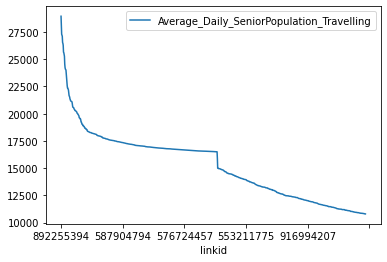

In [404]:
seniors_lies_sing.reset_index().plot(x='linkid', y='Average_Daily_SeniorPopulation_Travelling')

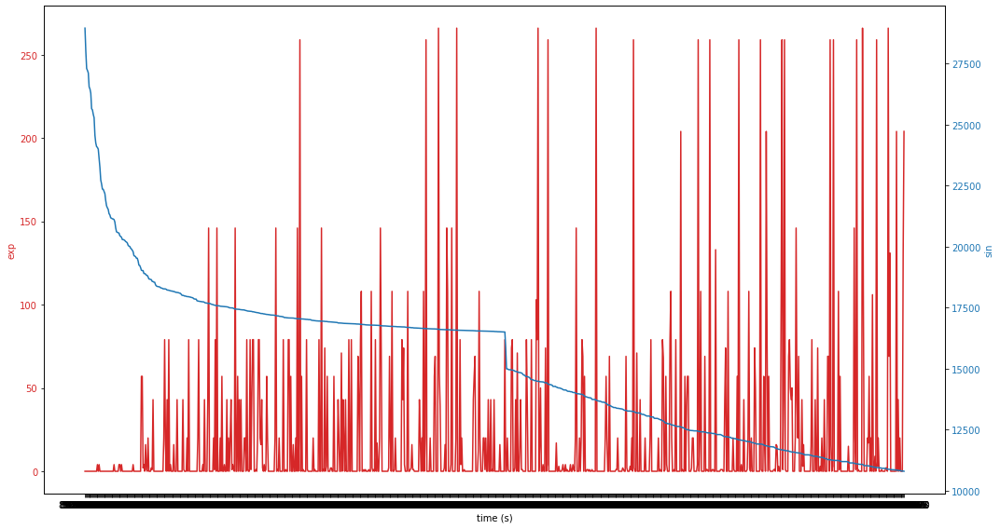

In [410]:
# Create some mock data
t = seniors_lies_sing.index
data1 = seniors_lies_sing['inside_stops']
data2 = seniors_lies_sing['Average_Daily_SeniorPopulation_Travelling']

fig, ax1 = plt.subplots(figsize=(15,8))

color = 'tab:red'
ax1.set_xlabel('time (s)')
ax1.set_ylabel('exp', color=color)
ax1.plot(t, data1, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('sin', color=color)  # we already handled the x-label with ax1
ax2.plot(t, data2, color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

In [350]:
seniors_lies_na[["linkid", "Average_Daily_SeniorPopulation_Travelling"]]

,linkid,Average_Daily_SeniorPopulation_Travelling
300,892255394,28955.43921
301,892255410,28010.52814
302,866997571,27302.67565
303,576717081,27219.59437
304,820574811,27119.89684
...,...,...
495,906582149,10819.31358
496,576723975,10800.56614
497,543097957,10800.56614
498,902236948,10800.13532


In [351]:
m = folium.Map([38.668335400000004, -9.0533746])
marker_cluster = MarkerCluster(name='Bus Stops').add_to(m)
## STOPS
for c, row in stops.iterrows():
    coord = [row['stop_lat'], row['stop_lon']]
    popup = folium.Popup(f'<p><b>Stop Name:</b></p> <p>{c}</p>',
                     max_width=100)
    tooltip = 'Stop name'
    icon = BeautifyIcon(icon="bus", iconShape='marker')
    folium.Marker(coord, popup=popup, tooltip=tooltip, icon=icon).add_to(marker_cluster)

## SHAPES OF LINKID
for c, row in seniors.iterrows():
    try:
        folium.Choropleth(
            geo_data=row['boundaries'],
            name="LinkIDBoundaries",
#             data=seniors_lies_na,
#             columns=["linkid", "Average_Daily_SeniorPopulation_Travelling"],
#             key_on="feature.linkid",
            fill_color="blue",
            fill_opacity=.3,
            line_opacity=0.2,
            legend_name="Daily Senior Population travelling",
            highlight=True,
        ).add_to(m)
    except: 
        continue
folium.LayerControl().add_to(m)
m